# Drive

In [2]:
from google.colab import drive
drive.mount('/content/gdrive/')
root_dir = "/content/gdrive/My Drive/"

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


# Libs

In [3]:
!pip install deep-translator

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 1.4 MB/s eta 0:00:00


In [4]:
!pip install salesforce-lavis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 23.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 83.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.4/235.4 kB 28.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.8/47.8 MB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.7/203.7 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━

In [5]:
import pandas as pd
import numpy as np
from PIL import Image
import requests
from tqdm import tqdm
import torch
import torch.nn.functional as F
from pkg_resources import packaging
from glob import glob
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
sns.set_theme("notebook", font_scale=1.3)
import os
import json
from deep_translator import GoogleTranslator
from scipy import spatial

from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode
import numpy as np, matplotlib, matplotlib.pyplot as plt, seaborn as sns

# Unzip folder

In [6]:
!unzip /content/pietanze.zip

Archive:  /content/pietanze.zip
   creating: pietanze/
  inflating: pietanze/mappa.json     
  inflating: pietanze/.DS_Store      
   creating: pietanze/dolce/
  inflating: pietanze/dolce/bigne_1.jpg  
  inflating: pietanze/dolce/.DS_Store  
  inflating: pietanze/dolce/tiramisu_2.jpeg  
  inflating: pietanze/dolce/bigne_2.jpg  
  inflating: pietanze/dolce/bigne_3.jpg  
  inflating: pietanze/dolce/baba_1.jpeg  
  inflating: pietanze/dolce/crostata_1.jpg  
  inflating: pietanze/dolce/crostata_3.jpg  
  inflating: pietanze/dolce/crostata_2.jpg  
  inflating: pietanze/dolce/baba_2.jpg  
  inflating: pietanze/dolce/baba_3.jpg  
  inflating: pietanze/dolce/panna_cotta_1.jpeg  
  inflating: pietanze/dolce/panna_cotta_2.jpg  
  inflating: pietanze/dolce/panna_cotta_3.jpg  
  inflating: pietanze/dolce/tiramisu_1.jpg  
  inflating: pietanze/dolce/tiramisu_3.jpg  
  inflating: pietanze/dolce/millefoglie_1.jpg  
  inflating: pietanze/dolce/millefoglie_2.jpg  
  inflating: pietanze/dolce/millefogli

In [7]:
import json
image_map = None
with open('/content/pietanze/mappa.json', 'r') as f:
    image_map = json.load(f)

# Functions

In [8]:
# setting device on GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))

Using device: cuda

Tesla T4


In [9]:
def translate_caption(string):
    try:
        #print('ita_string: ', string)
        string_translated = GoogleTranslator(source='auto', target='en').translate(string)
        #print('string_translated: ', string_translated)
        return string_translated
    except Exception as e:
        string_translated = ''
        print("Errore per ita_string '{}' - caption '{}' - errore: {}".format(string))
        return string_translated

# Load images and texts

Read the map with the path to the images and their corresponding descriptions. Put the images and the descriptions in the lists "images" and "texts". Show images, description and name in a figure

In [10]:
principal_dir = "/content/pietanze"

images = []
texts = []
names_image = []
original_texts = []
#plt.figure(figsize=(300, 300)) # Width, height

# iter over the dishes
for _, dishes, _ in os.walk(principal_dir):
    for dish in dishes:
        path_dish = os.path.join(principal_dir, dish)
        CHECK_FOLDER = os.path.isdir(path_dish)
        if CHECK_FOLDER:
            print("DISH: ", dish)
            print("PATH DISH: ", path_dish)

            images_list = os.listdir(path_dish)
            print("images_list: ", images_list)
            for name_image in images_list:
                if name_image != ".DS_Store" and name_image != ".ipynb_checkpoints":
                    path_image = os.path.join(path_dish, name_image)
                    chiave = ("/").join(path_image.split("/")[2:])
                    image = Image.open(path_image).convert("RGB")
                    origninal_text = image_map[chiave]
                    text = translate_caption(origninal_text)

                    #plt.subplot(len(image_map), 1, len(images) + 1)
                    #plt.imshow(image)
                    #plt.title(f"{name_image}\n{text}")
                    #plt.xticks([])
                    #plt.yticks([])

                    images.append(image)
                    texts.append(text)
                    names_image.append(name_image)
                    original_texts.append(origninal_text)

            print("----------------------------------")

#plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/list_images_descriptions.png")
#plt.tight_layout()

DISH:  dolce
PATH DISH:  /content/pietanze/dolce
images_list:  ['panna_cotta_1.jpeg', 'baba_3.jpg', 'panna_cotta_2.jpg', 'crostata_2.jpg', 'tiramisu_2.jpeg', 'bigne_1.jpg', 'tiramisu_1.jpg', 'bigne_3.jpg', 'crostata_3.jpg', 'bigne_2.jpg', 'millefoglie_3.jpg', 'panna_cotta_3.jpg', 'millefoglie_2.jpg', 'crostata_1.jpg', 'baba_1.jpeg', '.DS_Store', 'tiramisu_3.jpg', 'millefoglie_1.jpg', 'baba_2.jpg']
----------------------------------
DISH:  pizza
PATH DISH:  /content/pietanze/pizza
images_list:  ['pizza_marinara_2.jpg', 'pizza_marinara_3.jpg', 'pizza_capricciosa_2.jpg', 'pizza_margherita_2.jpg', 'pizza_capricciosa_1.jpg', 'calzone_2.jpg', 'pizza_napoli_2.jpg', 'pizza_quattro_formaggi_2.jpg', 'pizza_margherita_3.jpg', 'pizza_quattro_formaggi_1.jpg', 'pizza_quattro_stagioni.jpg', 'pizza_marinara_1.jpg', 'pizza_margherita_1.jpg', '.DS_Store', 'pizza_napoli.jpg', 'pizza_quattro_stagioni_2.jpg', 'calzone.jpg', 'pizza_quattro_stagioni_3.jpg']
----------------------------------
DISH:  carne
PAT

# Apply BLIP2 from LAVIS lib - images, text and multimodal embedding

name="blip2_feature_extractor", model_type="pretrain"

In [11]:
from lavis.models import load_model_and_preprocess
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip2_feature_extractor", model_type="pretrain", is_eval=True, device=device)

100%|██████████| 1.89G/1.89G [01:31<00:00, 22.2MB/s]


100%|██████████| 712M/712M [00:32<00:00, 23.0MB/s]


## Extraction of the embeddings

In [12]:
images_embedding = None
texts_embedding = None
multimodal_embedding = None

# iter over the list of text and images

for text, image in zip(texts,images):
    image_processed = vis_processors["eval"](image).unsqueeze(0).to(device)
    text_translated = translate_caption(text)
    text_input = txt_processors["eval"](text_translated)
    sample = {"image": image_processed, "text_input": [text_input]}

    multimodal_emb = model.extract_features(sample).multimodal_embeds[:,0,:] # size (1, 768)
    image_emb = model.extract_features(sample, mode="image").image_embeds[:,0,:] # size (1, 768)
    text_emb = model.extract_features(sample, mode="text").text_embeds[:,0,:] # size (1, 768)

    # stack tensor
    if images_embedding is None:
        images_embedding = image_emb
    else:
       images_embedding = torch.cat((images_embedding, image_emb),0)

    if texts_embedding is None:
        texts_embedding = text_emb
    else:
       texts_embedding = torch.cat((texts_embedding, text_emb),0)

    if multimodal_embedding is None:
        multimodal_embedding = multimodal_emb
    else:
       multimodal_embedding = torch.cat((multimodal_embedding, multimodal_emb),0)

print('images_embedding.size(): ', images_embedding.size())
print('texts_embedding.size(): ', texts_embedding.size())
print('multimodal_embedding.size(): ', multimodal_embedding.size())
'''
images_embedding.size():  torch.Size([69, 768])
texts_embedding.size():  torch.Size([69, 768])
multimodal_embedding.size():  torch.Size([69, 768])
'''

images_embedding.size():  torch.Size([68, 768])
texts_embedding.size():  torch.Size([68, 768])
multimodal_embedding.size():  torch.Size([68, 768])


'\nimages_embedding.size():  torch.Size([69, 768])\ntexts_embedding.size():  torch.Size([69, 768])\nmultimodal_embedding.size():  torch.Size([69, 768])\n'

## Normalization

Divide each tensors by its norm. In this way when i calculate the dot product between two tensors i directly obtain the cosin between the two

In [13]:
images_embedding /= images_embedding.norm(dim=-1, keepdim=True)
texts_embedding /= texts_embedding.norm(dim=-1, keepdim=True)
multimodal_embedding /= multimodal_embedding.norm(dim=-1, keepdim=True)

## Similarity matrices

In [14]:
## image vs image
similarity_images = images_embedding.cpu().detach().numpy() @ images_embedding.cpu().detach().numpy().T
similarity_images_texts = images_embedding.cpu().detach().numpy() @ texts_embedding.cpu().detach().numpy().T
similarity_multimodal = multimodal_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T
similarity_images_multimodal = images_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T

function to plot the similarity matrixfor the plot i use
https://stackoverflow.com/questions/67310634/how-to-plot-image-image-similarity-matrix-map

In [15]:
def ImgLabels(N, ax):

    def offset_image(coord, image_plot, ax):

        im = matplotlib.offsetbox.OffsetImage(image_plot, zoom = 1)
        im.image.axes = ax

        for co, xyb in [((0, coord), (-30, -30)),    ((coord, N), (+30, -30))]: # these number have to be adjusted if change the image dimension as well as the number of examples
            ab = matplotlib.offsetbox.AnnotationBbox(im, co,  xybox = xyb,
                frameon=False, xycoords='data',  boxcoords="offset points", pad=0)
            ax.add_artist(ab)

    for i, img in enumerate(images):
        image_resized = img.resize((55, 55))
        offset_image(i, image_resized, ax)

def HeatMap(N, corr):
    sns.set_theme(style = "white")
    mask = np.triu(np.ones_like(corr, dtype = bool))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
                square=True, annot = True, xticklabels = False, yticklabels = False)


def plot_similarity_matrix(matrix, dimension, name_fig):
    f, ax = plt.subplots(figsize=(100, 100))
    HeatMap(dimension, matrix)
    ImgLabels(dimension, ax)
    plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/similarity_matrices/"+name_fig+".png")
    plt.show()

### Image-image similarity

In [16]:
name_fig = "images_blip2_pretrained"
plot_similarity_matrix(similarity_images, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Image-text similarity

In [17]:
name_fig = "images_texts_blip2_pretrained"
plot_similarity_matrix(similarity_images_texts, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Multimodal-multimodal similarity

In [18]:
name_fig = "multimodal_blip2_pretrained"
plot_similarity_matrix(similarity_multimodal, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Images-multimodal similarity

In [19]:
name_fig = "images_multimodal_blip2_pretrained"
plot_similarity_matrix(similarity_images_multimodal, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

## Search function

search_modality: (II for image vs image - TI for text vs image - MI for multimodal vs image -  IT for image vs text - TT for text vs text - MT for multimodal vs text - IM for image vs multimodal - TM for text vs multimodal - MM for multimodal vs multimodal). The first argument refers to the target product the second for the database product

In [20]:
def search_similar_product(image_target, text_target, number_retrieval, search_modality, len_dataset = 68, is_coco_finetuned = False):

    retrieval_map = {}

    # preprocess image. check if the image is None. In this case build a tensor with shape (1, 3, 224, 224)
    if image_target is None:
        if is_coco_finetuned:
            image_processed = torch.rand(1, 3, 364, 364).to(device)
        else:
            image_processed = torch.rand(1, 3, 224, 224).to(device)
    else:
      image_processed = vis_processors["eval"](image_target).unsqueeze(0).to(device)

    # preprocess text
    text_translated = translate_caption(text_target)
    text_input = txt_processors["eval"](text_translated)

    # build sample
    sample = {"image": image_processed, "text_input": [text_input]}

    # find features of image and text target
    multimodal_emb = model.extract_features(sample).multimodal_embeds[0,0,:] # size (768)
    image_emb = model.extract_features(sample, mode="image").image_embeds[0,0,:] # size (768)
    text_emb = model.extract_features(sample, mode="text").text_embeds[0,0,:] # size (768)

    # normalize
    image_emb /= image_emb.norm(dim=-1, keepdim=True)
    text_emb /= text_emb.norm(dim=-1, keepdim=True)
    multimodal_emb /= multimodal_emb.norm(dim=-1, keepdim=True)

    # transform to numpy tensor
    image_emb = image_emb.cpu().detach().numpy()
    text_emb = text_emb.cpu().detach().numpy()
    multimodal_emb = multimodal_emb.cpu().detach().numpy()

    if search_modality == "II":
      similarity_vector = images_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ multimodal_emb.T

    index_sorted = np.argsort(similarity_vector)

    for i in range(1, number_retrieval+1):

        print("Extracted: ", i)

        # index of the db product
        idx = index_sorted[len_dataset-i]
        similarity_value = similarity_vector[idx]

        print("idx: ", idx)
        print("similarity value: ", similarity_value)

        # extract name of the image
        name_image_found = names_image[idx]
        print("name_image_found: ", name_image_found)
        print("-----------------------")

        # extract text of the image
        text_image_found = original_texts[idx]
        translated_text_image_found = texts[idx]

        # extract image
        image_found = images[idx]

        #fill the extracted infos in the map
        retrieval_map[i] = (image_found, name_image_found, text_image_found, translated_text_image_found, similarity_value)

    return retrieval_map

### Test 1

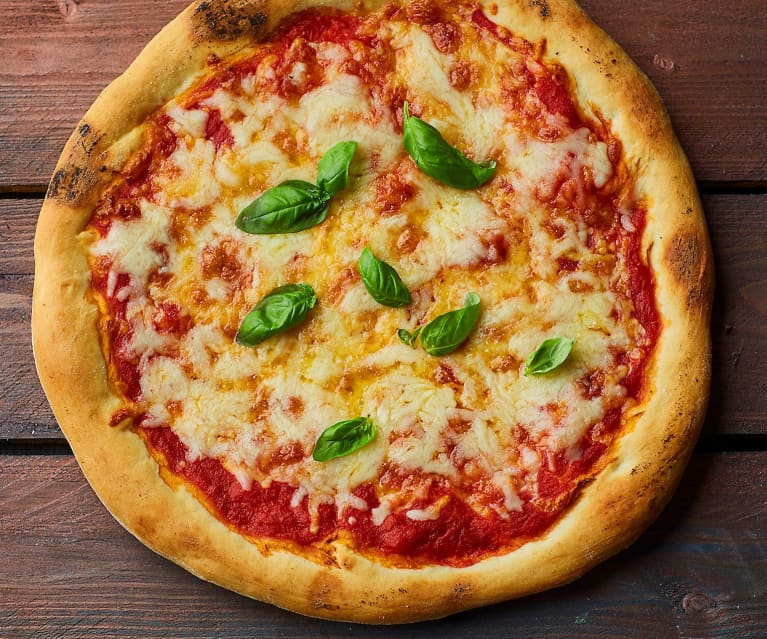

In [21]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pizza_marghetita_test.jpg"
text_image_target = ""
number_retrieval = 3
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  30
similarity value:  0.9015351
name_image_found:  pizza_margherita_1.jpg
-----------------------
Extracted:  2
idx:  33
similarity value:  0.8005841
name_image_found:  calzone.jpg
-----------------------
Extracted:  3
idx:  23
similarity value:  0.74468315
name_image_found:  calzone_2.jpg
-----------------------


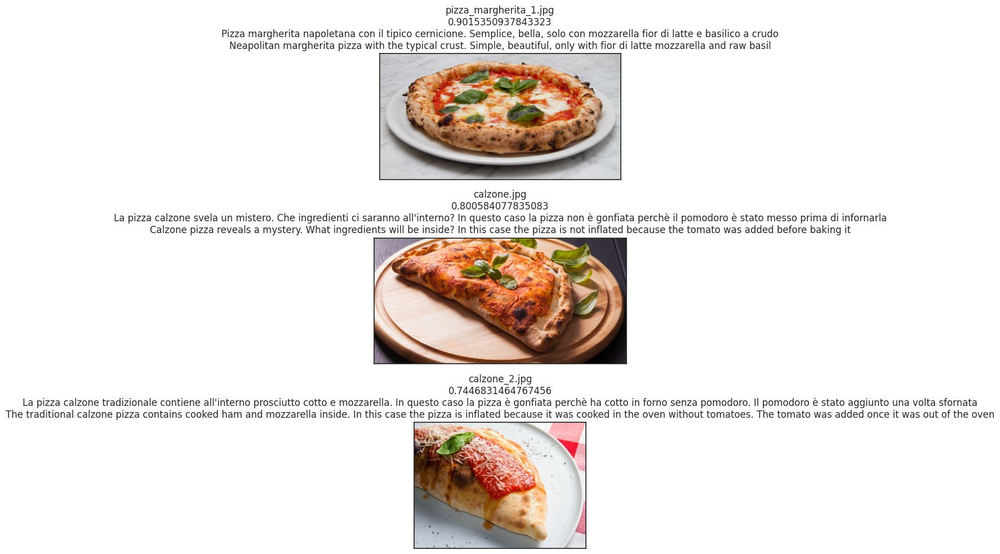

In [22]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 2

In [23]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/bistecca_fiorentina_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Output hidden; open in https://colab.research.google.com to view.

Extracted:  1
idx:  48
similarity value:  0.90287125
name_image_found:  bistecca_fiorentina_3.jpg
-----------------------
Extracted:  2
idx:  47
similarity value:  0.52947843
name_image_found:  filetto_manzo_1.jpg
-----------------------
Extracted:  3
idx:  53
similarity value:  0.50381863
name_image_found:  bistecca_fiorentina_1.jpg
-----------------------
Extracted:  4
idx:  43
similarity value:  0.45197424
name_image_found:  bistecca_fiorentina_2.jpg
-----------------------
Extracted:  5
idx:  29
similarity value:  0.40806085
name_image_found:  pizza_marinara_1.jpg
-----------------------


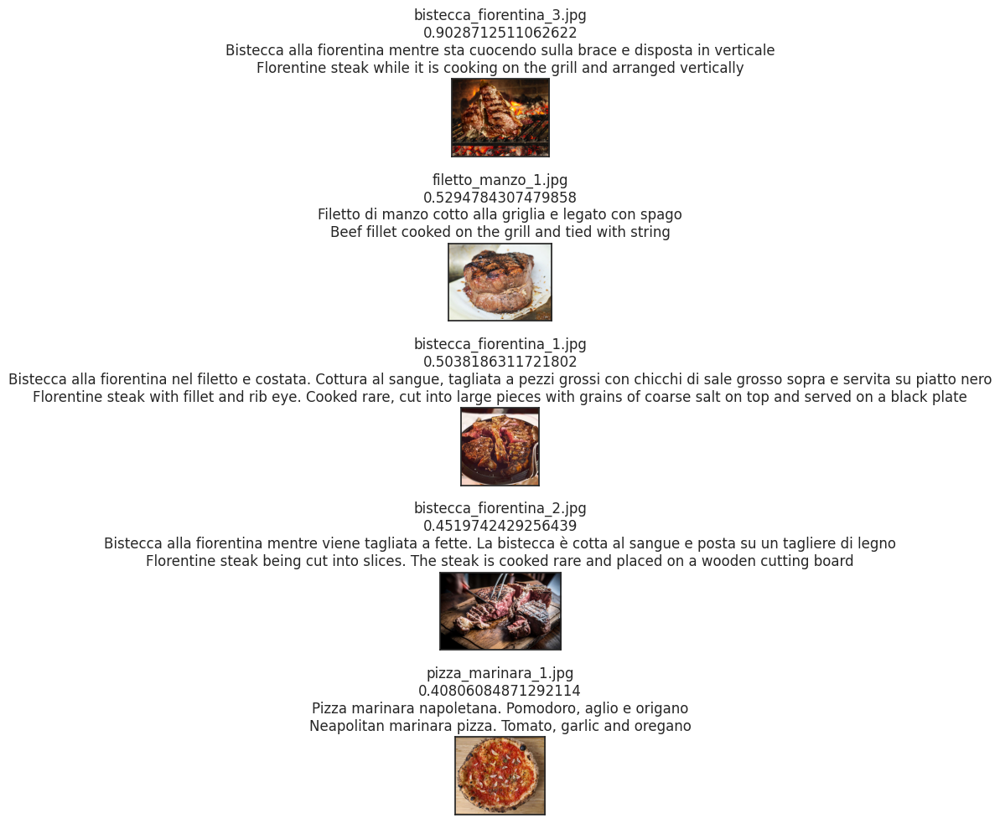

In [24]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 3


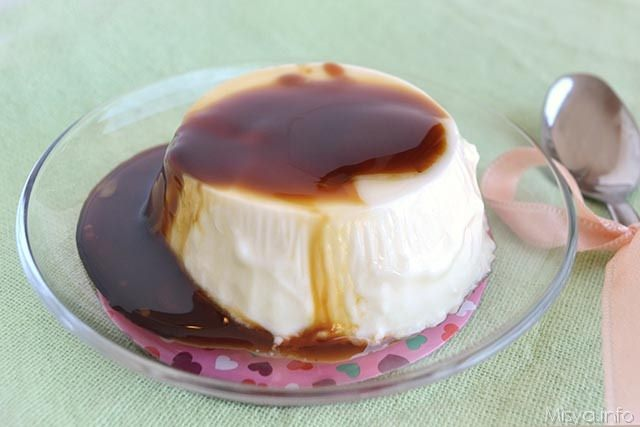

In [25]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/panna_cotta_caramello_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  2
similarity value:  0.92750466
name_image_found:  panna_cotta_2.jpg
-----------------------
Extracted:  2
idx:  11
similarity value:  0.7895942
name_image_found:  panna_cotta_3.jpg
-----------------------
Extracted:  3
idx:  0
similarity value:  0.65807015
name_image_found:  panna_cotta_1.jpeg
-----------------------
Extracted:  4
idx:  15
similarity value:  0.51422596
name_image_found:  tiramisu_3.jpg
-----------------------
Extracted:  5
idx:  46
similarity value:  0.47508153
name_image_found:  vitello_tonnato_2.jpg
-----------------------


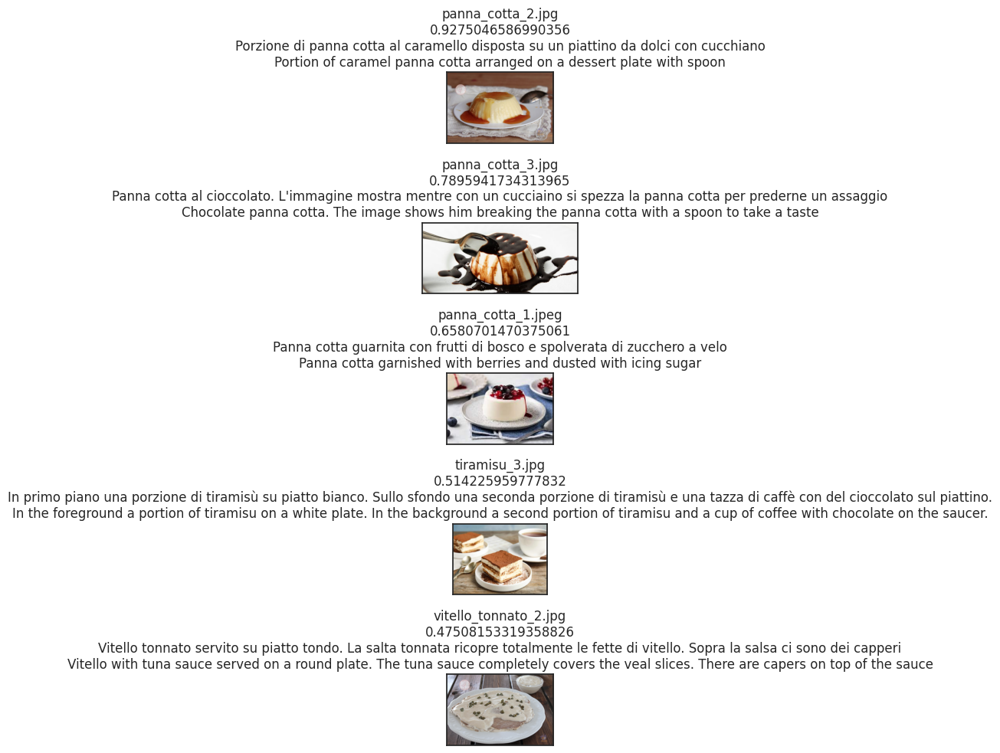

In [26]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 4

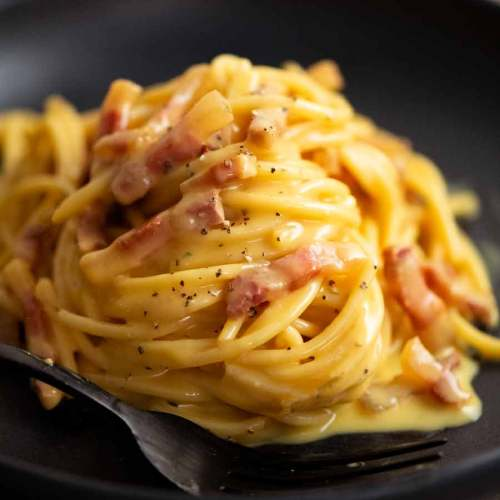

In [27]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pasta_carbonara_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  60
similarity value:  0.8237556
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  2
idx:  67
similarity value:  0.6195301
name_image_found:  carbonara_3.jpeg
-----------------------
Extracted:  3
idx:  59
similarity value:  0.6053867
name_image_found:  carbonara_1.jpg
-----------------------
Extracted:  4
idx:  57
similarity value:  0.58234906
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  5
idx:  64
similarity value:  0.5796759
name_image_found:  pasta_amatriciana_2.jpg
-----------------------


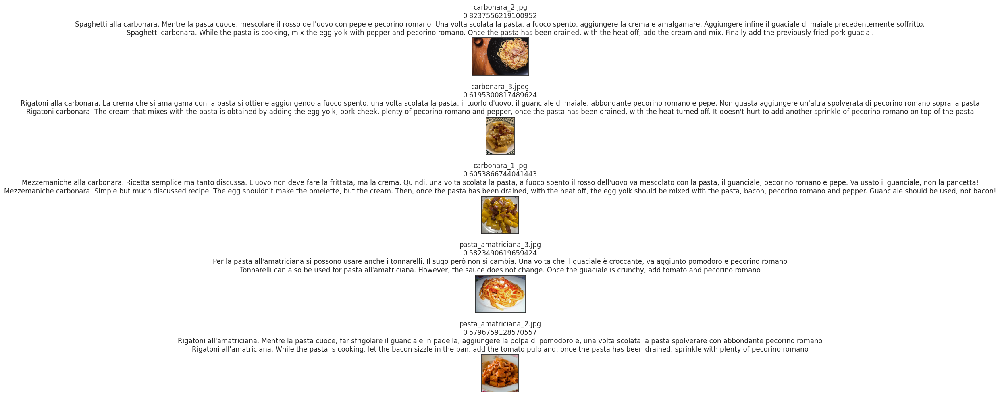

In [28]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 5

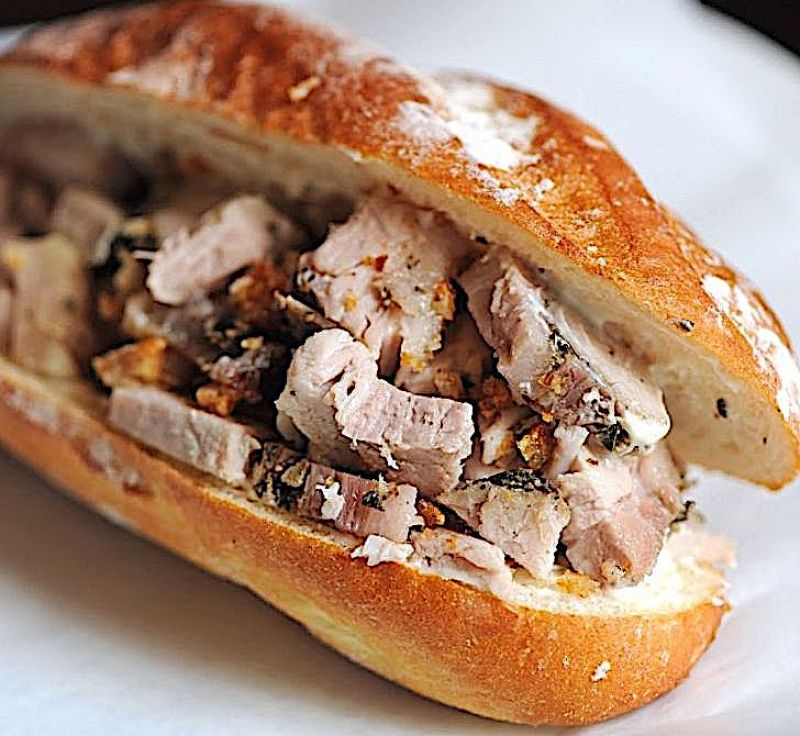

In [29]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/panino_porchetta_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  51
similarity value:  0.6623894
name_image_found:  porchetta_1.jpg
-----------------------
Extracted:  2
idx:  50
similarity value:  0.5407235
name_image_found:  porchetta_2.jpg
-----------------------
Extracted:  3
idx:  41
similarity value:  0.53698397
name_image_found:  porchetta_3.jpg
-----------------------
Extracted:  4
idx:  38
similarity value:  0.5158581
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  5
idx:  40
similarity value:  0.48568788
name_image_found:  vitello_tonnato_3.jpg
-----------------------


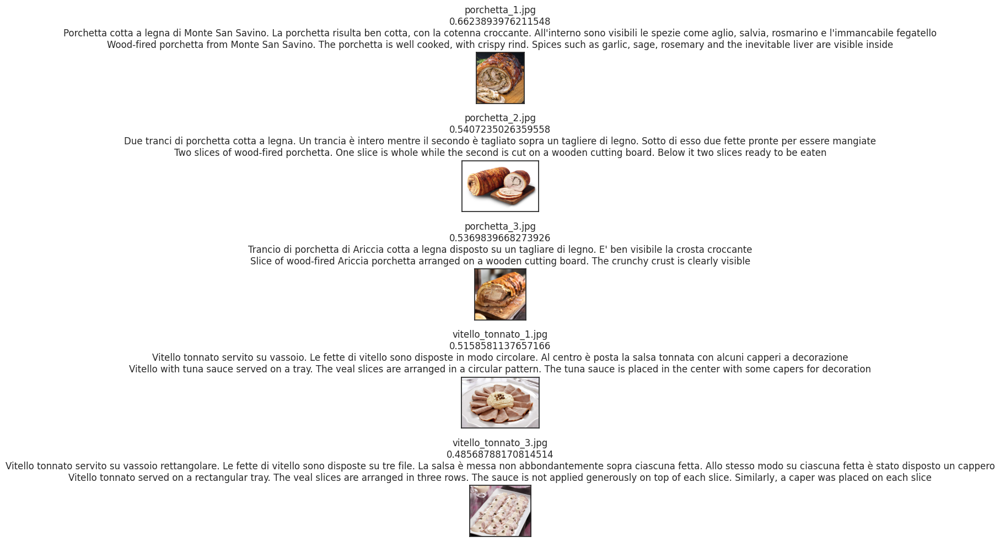

In [30]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 6

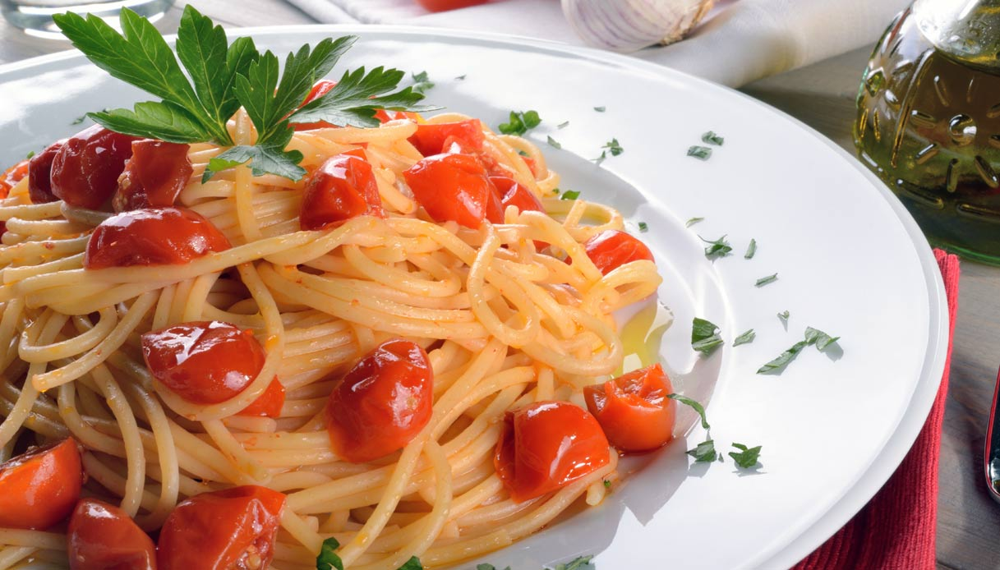

In [31]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pasta_pomodorini_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  57
similarity value:  0.74404794
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  2
idx:  66
similarity value:  0.7207321
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  3
idx:  60
similarity value:  0.6966759
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  4
idx:  62
similarity value:  0.6752686
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  5
idx:  55
similarity value:  0.6341174
name_image_found:  pasta_norma_2.jpg
-----------------------


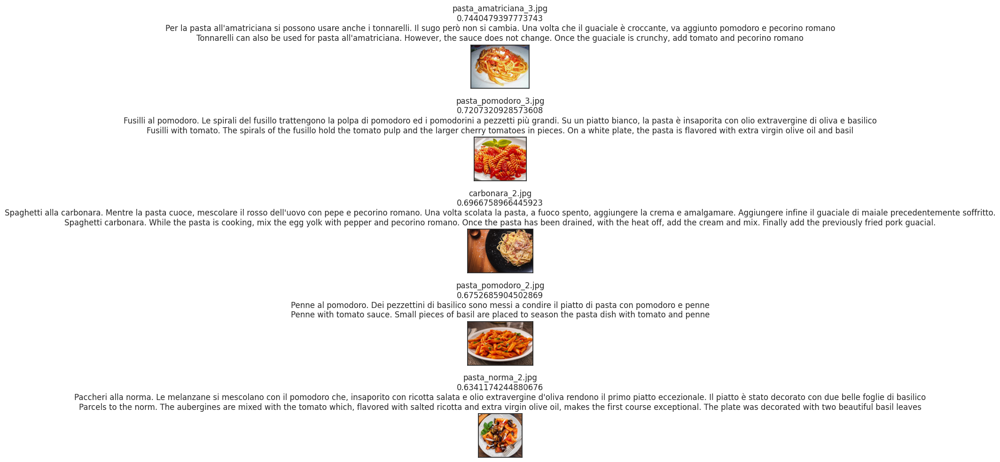

In [32]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 7

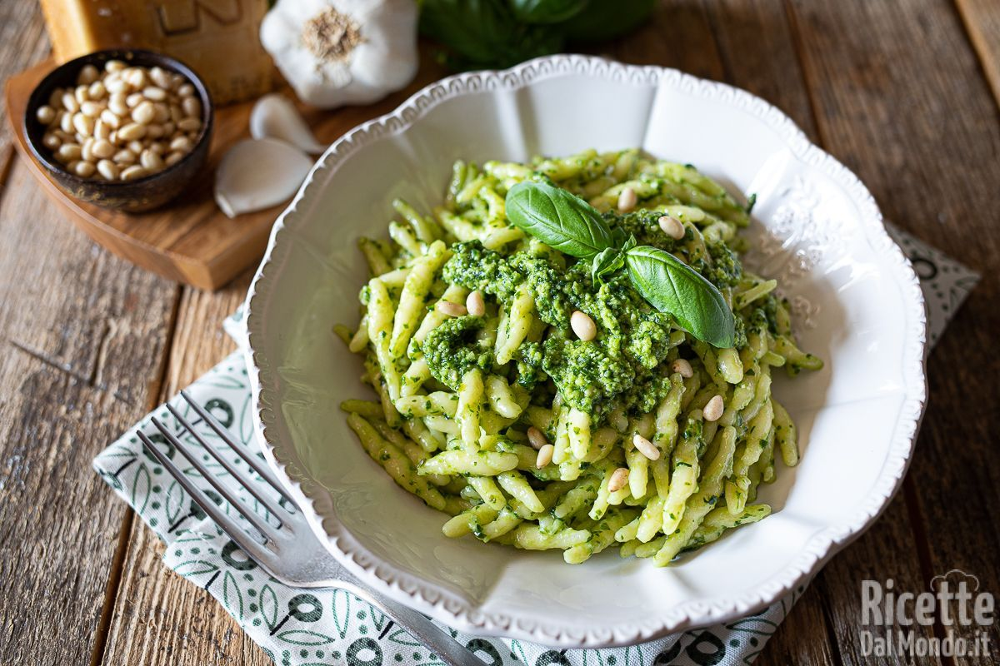

In [33]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/trofie_pesto_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  56
similarity value:  0.75532055
name_image_found:  pasta_pesto_1.jpg
-----------------------
Extracted:  2
idx:  58
similarity value:  0.74324185
name_image_found:  pasta_pesto_2.jpg
-----------------------
Extracted:  3
idx:  62
similarity value:  0.6741258
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  4
idx:  67
similarity value:  0.5905036
name_image_found:  carbonara_3.jpeg
-----------------------
Extracted:  5
idx:  55
similarity value:  0.58881783
name_image_found:  pasta_norma_2.jpg
-----------------------


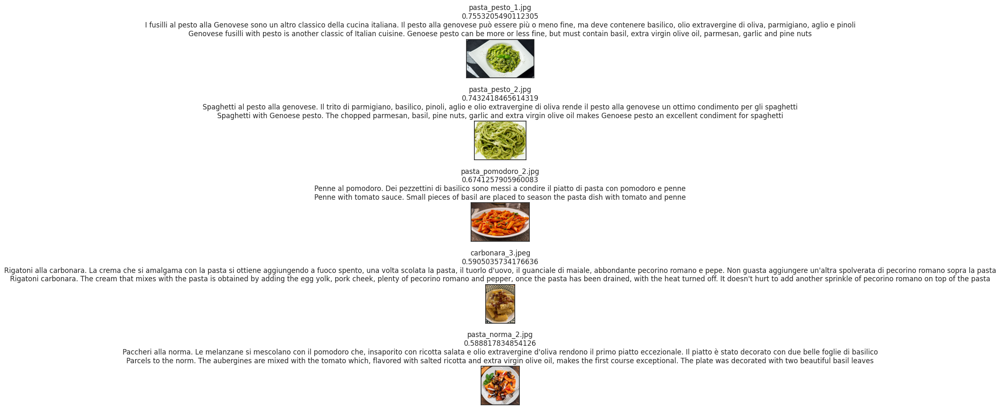

In [34]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 8

In [35]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/vitello_tonnato_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Output hidden; open in https://colab.research.google.com to view.

Extracted:  1
idx:  38
similarity value:  0.8791796
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  2
idx:  40
similarity value:  0.83661294
name_image_found:  vitello_tonnato_3.jpg
-----------------------
Extracted:  3
idx:  46
similarity value:  0.79199415
name_image_found:  vitello_tonnato_2.jpg
-----------------------
Extracted:  4
idx:  49
similarity value:  0.6534567
name_image_found:  filetto_pepe_verde_2.png
-----------------------
Extracted:  5
idx:  35
similarity value:  0.6371353
name_image_found:  petto_pollo_pizzaiola_2.jpg
-----------------------


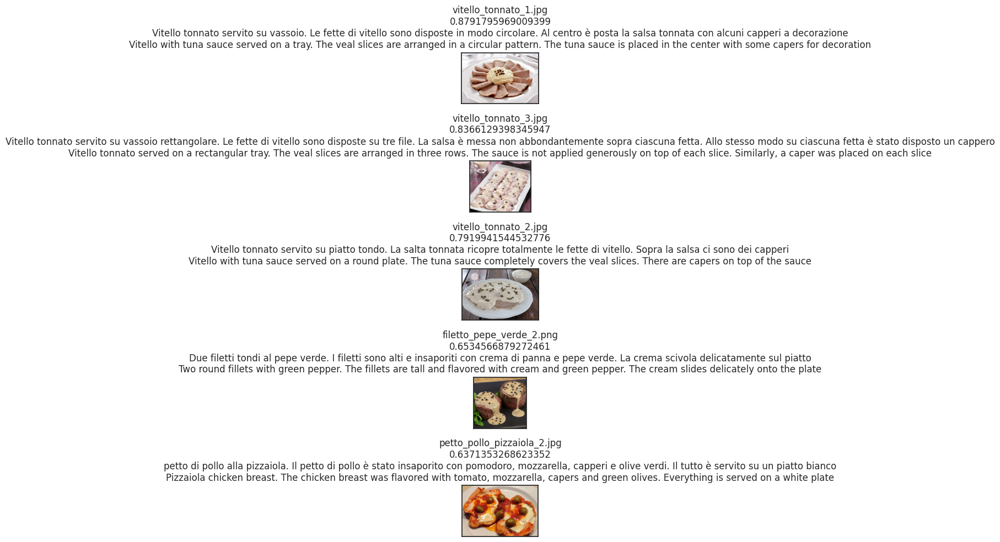

In [36]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 9

In [37]:
text_image_target = "Pizza quattro stagioni con olive, funghi e prosciutto cotto"
number_retrieval = 5

Extracted:  1
idx:  34
similarity value:  0.2514677
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------
Extracted:  2
idx:  32
similarity value:  0.22368422
name_image_found:  pizza_quattro_stagioni_2.jpg
-----------------------
Extracted:  3
idx:  20
similarity value:  0.22336997
name_image_found:  pizza_capricciosa_2.jpg
-----------------------
Extracted:  4
idx:  24
similarity value:  0.2163938
name_image_found:  pizza_napoli_2.jpg
-----------------------
Extracted:  5
idx:  22
similarity value:  0.2094025
name_image_found:  pizza_capricciosa_1.jpg
-----------------------


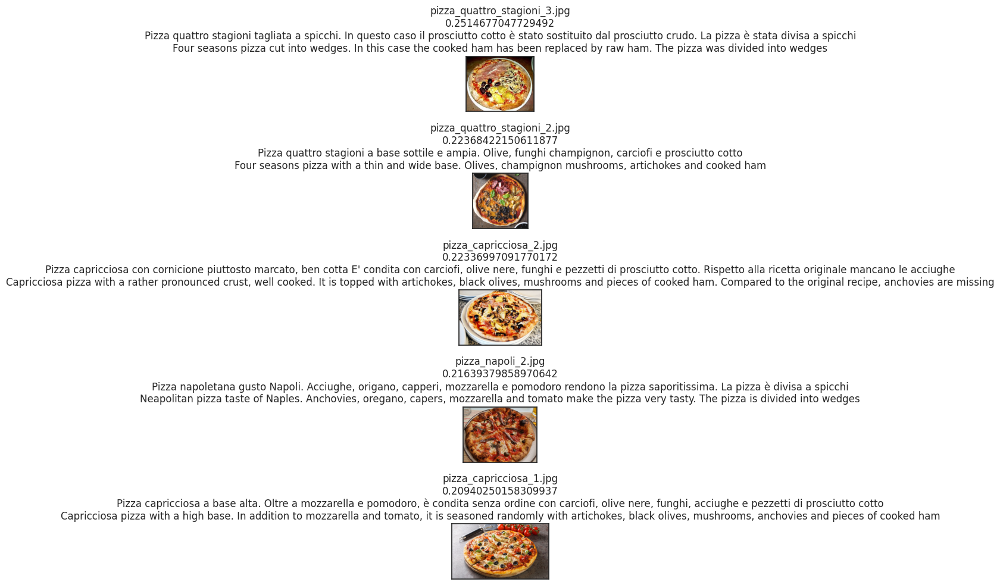

In [38]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  38
similarity value:  0.71611226
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  2
idx:  40
similarity value:  0.65200704
name_image_found:  vitello_tonnato_3.jpg
-----------------------
Extracted:  3
idx:  27
similarity value:  0.6403521
name_image_found:  pizza_quattro_formaggi_1.jpg
-----------------------
Extracted:  4
idx:  49
similarity value:  0.63905394
name_image_found:  filetto_pepe_verde_2.png
-----------------------
Extracted:  5
idx:  22
similarity value:  0.5703349
name_image_found:  pizza_capricciosa_1.jpg
-----------------------


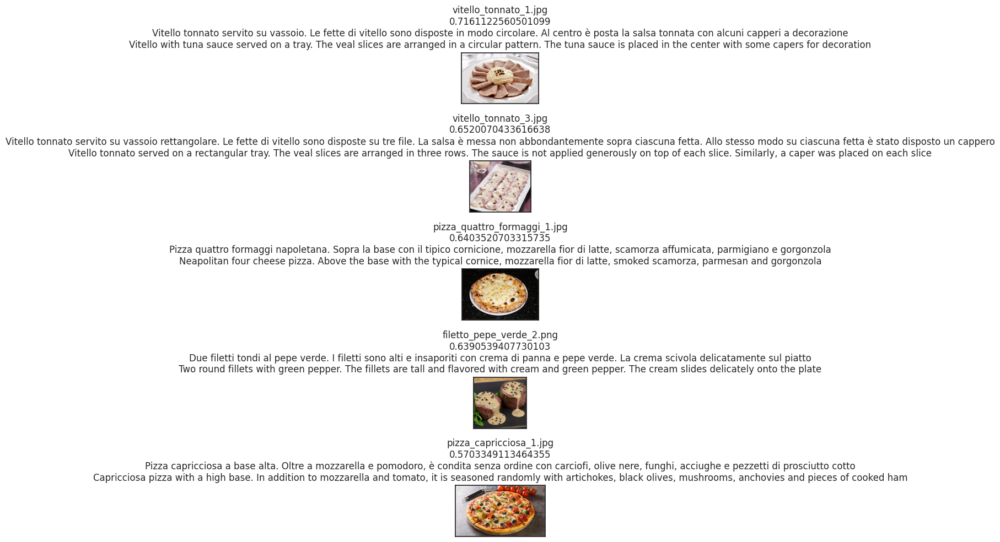

In [39]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  26
similarity value:  0.86271924
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  2
idx:  29
similarity value:  0.8604608
name_image_found:  pizza_marinara_1.jpg
-----------------------
Extracted:  3
idx:  21
similarity value:  0.8549534
name_image_found:  pizza_margherita_2.jpg
-----------------------
Extracted:  4
idx:  32
similarity value:  0.8426714
name_image_found:  pizza_quattro_stagioni_2.jpg
-----------------------
Extracted:  5
idx:  39
similarity value:  0.8203449
name_image_found:  pollo_arrosto_1.jpg
-----------------------


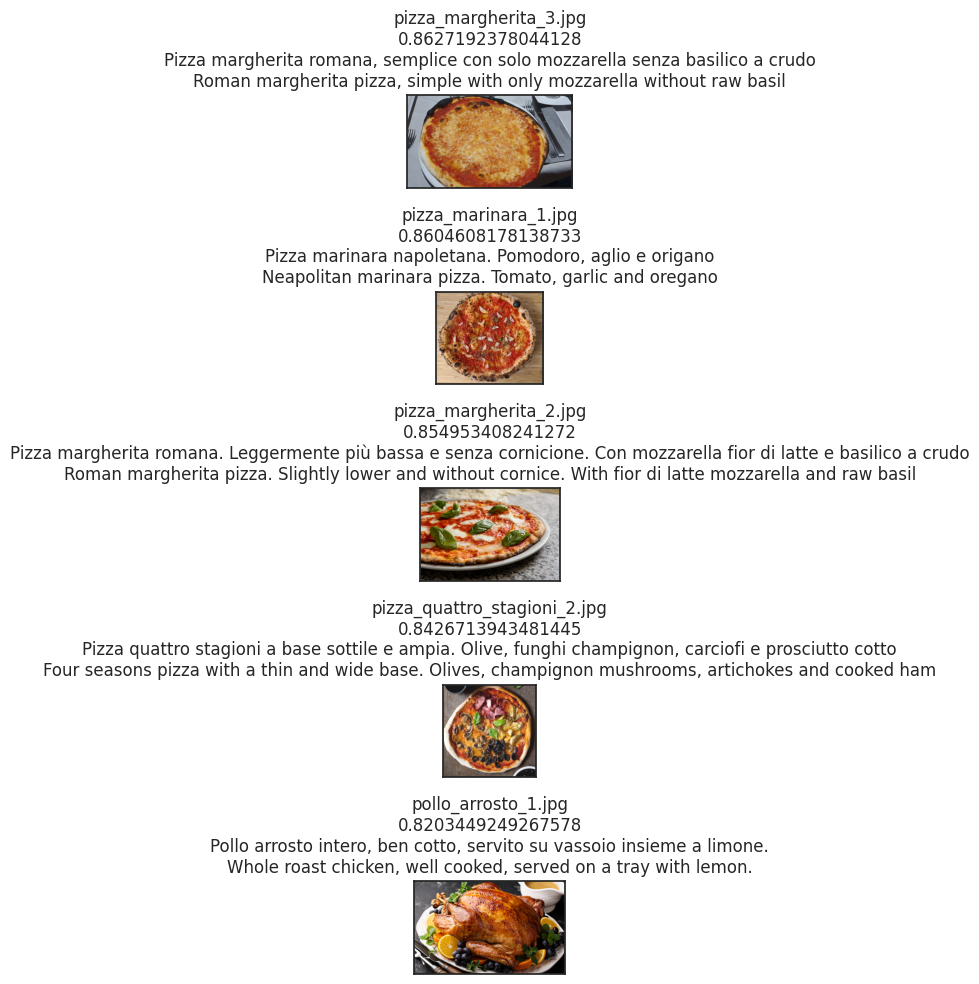

In [40]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")

plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 10

In [41]:
text_image_target = "PAppardelle al sugo di cinghiale senza pomodoro"
number_retrieval = 5

Extracted:  1
idx:  64
similarity value:  0.27007234
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  2
idx:  54
similarity value:  0.269908
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  3
idx:  66
similarity value:  0.2554081
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  4
idx:  65
similarity value:  0.23404789
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  5
idx:  23
similarity value:  0.22482403
name_image_found:  calzone_2.jpg
-----------------------


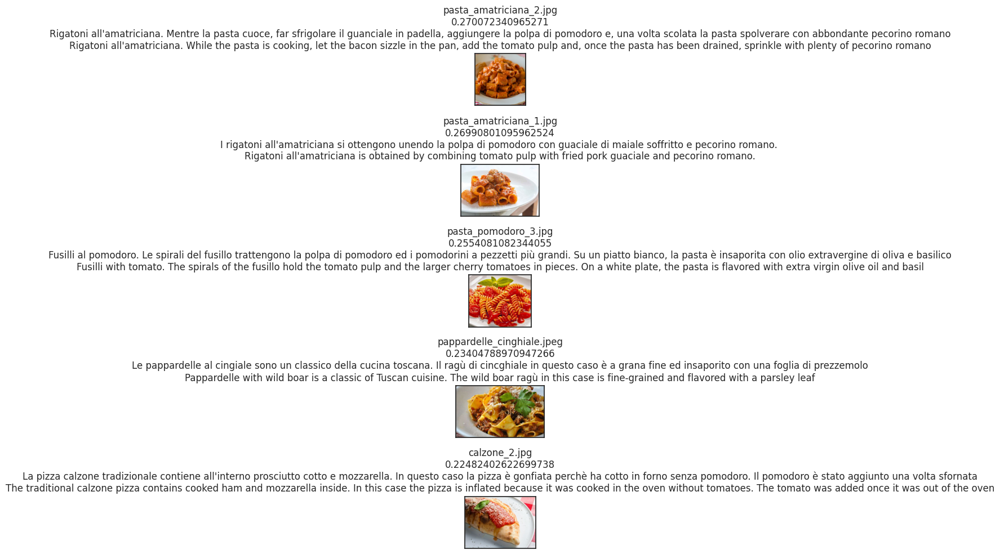

In [42]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  38
similarity value:  0.8331874
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  2
idx:  40
similarity value:  0.77837193
name_image_found:  vitello_tonnato_3.jpg
-----------------------
Extracted:  3
idx:  27
similarity value:  0.73030174
name_image_found:  pizza_quattro_formaggi_1.jpg
-----------------------
Extracted:  4
idx:  60
similarity value:  0.7097342
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  5
idx:  34
similarity value:  0.7077426
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------


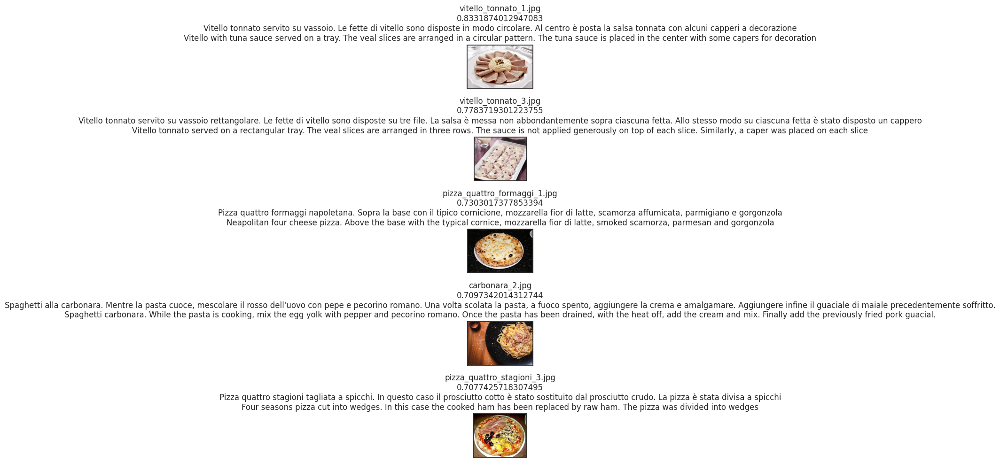

In [43]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  65
similarity value:  0.919931
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  2
idx:  54
similarity value:  0.85698885
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  3
idx:  29
similarity value:  0.8469914
name_image_found:  pizza_marinara_1.jpg
-----------------------
Extracted:  4
idx:  21
similarity value:  0.84125984
name_image_found:  pizza_margherita_2.jpg
-----------------------
Extracted:  5
idx:  26
similarity value:  0.84061205
name_image_found:  pizza_margherita_3.jpg
-----------------------


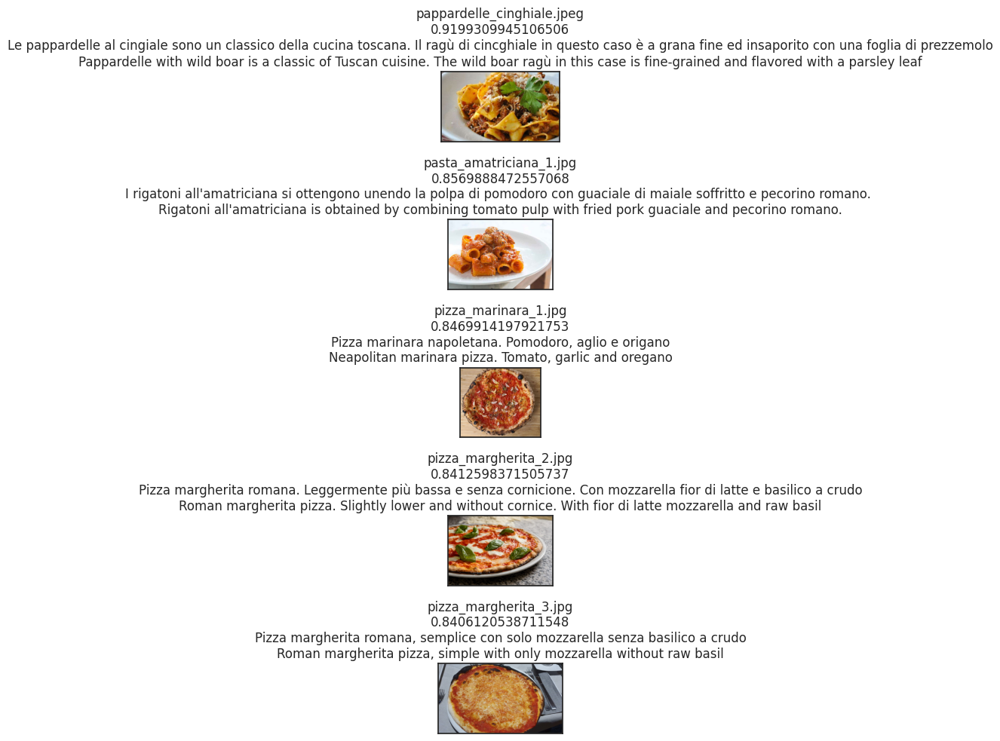

In [44]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 11

In [45]:
text_image_target = "Crostata con fragole, crema e gocce di cioccolato e zucchero a velo"
number_retrieval = 5

Extracted:  1
idx:  10
similarity value:  0.29564893
name_image_found:  millefoglie_3.jpg
-----------------------
Extracted:  2
idx:  13
similarity value:  0.26591244
name_image_found:  crostata_1.jpg
-----------------------
Extracted:  3
idx:  12
similarity value:  0.2464492
name_image_found:  millefoglie_2.jpg
-----------------------
Extracted:  4
idx:  8
similarity value:  0.2453842
name_image_found:  crostata_3.jpg
-----------------------
Extracted:  5
idx:  16
similarity value:  0.18270195
name_image_found:  millefoglie_1.jpg
-----------------------


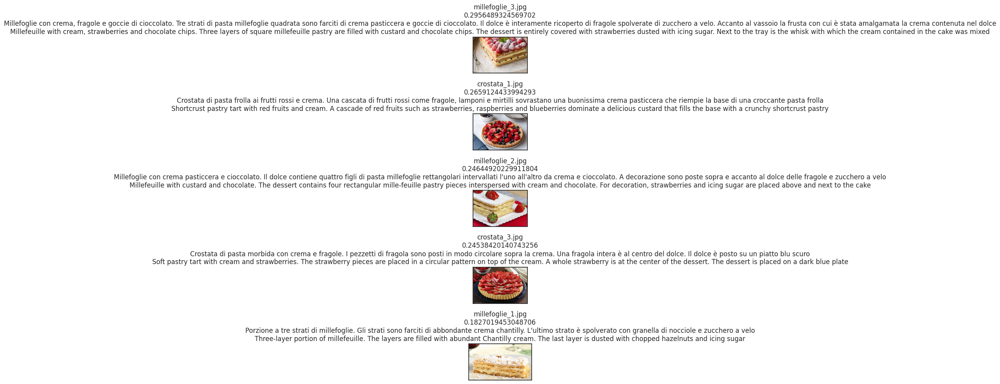

In [46]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  23
similarity value:  0.6299546
name_image_found:  calzone_2.jpg
-----------------------
Extracted:  2
idx:  47
similarity value:  0.54480267
name_image_found:  filetto_manzo_1.jpg
-----------------------
Extracted:  3
idx:  39
similarity value:  0.4807464
name_image_found:  pollo_arrosto_1.jpg
-----------------------
Extracted:  4
idx:  60
similarity value:  0.43993378
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  5
idx:  36
similarity value:  0.41428453
name_image_found:  filetto_pepe_verde.jpg
-----------------------


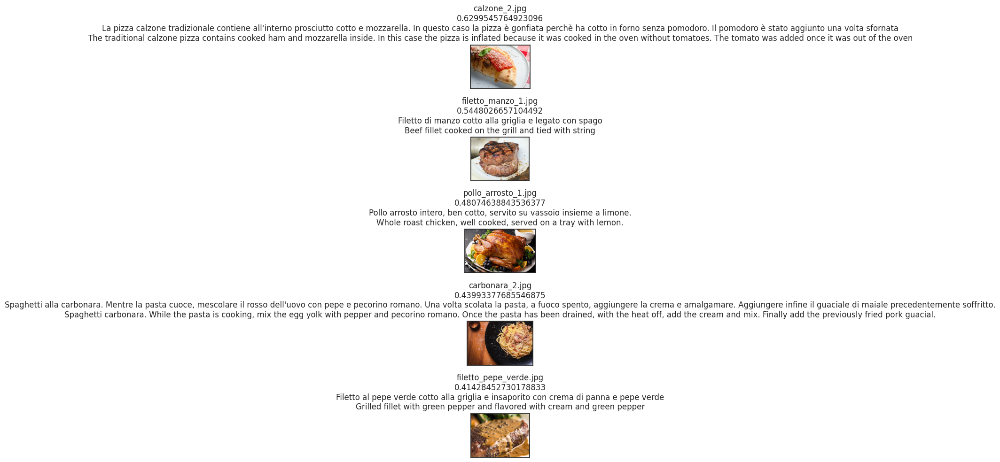

In [47]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  0
similarity value:  0.8830911
name_image_found:  panna_cotta_1.jpeg
-----------------------
Extracted:  2
idx:  12
similarity value:  0.8773272
name_image_found:  millefoglie_2.jpg
-----------------------
Extracted:  3
idx:  8
similarity value:  0.8599648
name_image_found:  crostata_3.jpg
-----------------------
Extracted:  4
idx:  13
similarity value:  0.84639215
name_image_found:  crostata_1.jpg
-----------------------
Extracted:  5
idx:  4
similarity value:  0.83892727
name_image_found:  tiramisu_2.jpeg
-----------------------


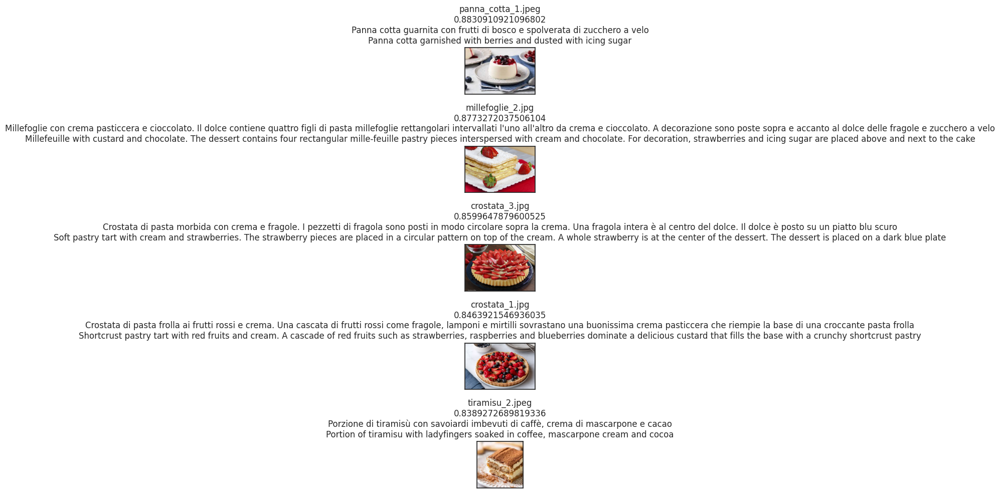

In [48]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 12

In [49]:
text_image_target = "Pasta all'amatriciana con pomodori, guanciale, spaghetti e spolverata di pecorino romano"
number_retrieval = 5

Extracted:  1
idx:  66
similarity value:  0.32133487
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  2
idx:  64
similarity value:  0.27851248
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  3
idx:  54
similarity value:  0.26505807
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  4
idx:  57
similarity value:  0.2628085
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  5
idx:  60
similarity value:  0.25142473
name_image_found:  carbonara_2.jpg
-----------------------


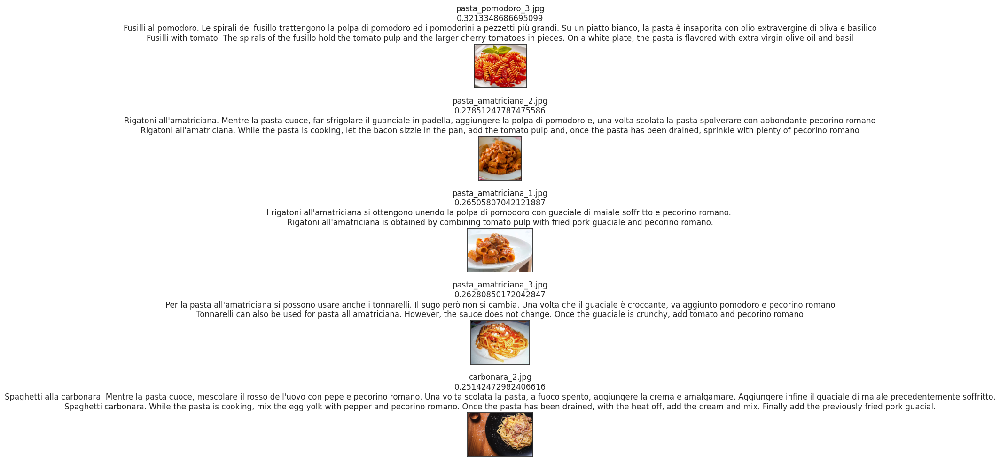

In [50]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  23
similarity value:  0.6660471
name_image_found:  calzone_2.jpg
-----------------------
Extracted:  2
idx:  47
similarity value:  0.57181084
name_image_found:  filetto_manzo_1.jpg
-----------------------
Extracted:  3
idx:  39
similarity value:  0.5096874
name_image_found:  pollo_arrosto_1.jpg
-----------------------
Extracted:  4
idx:  60
similarity value:  0.49934933
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  5
idx:  36
similarity value:  0.4527054
name_image_found:  filetto_pepe_verde.jpg
-----------------------


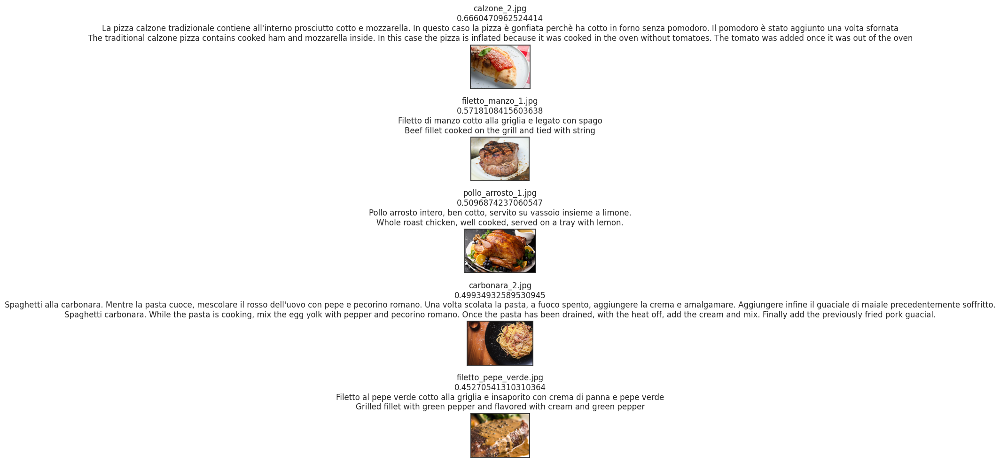

In [51]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  64
similarity value:  0.92417645
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  2
idx:  57
similarity value:  0.8895444
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  3
idx:  62
similarity value:  0.8781277
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  4
idx:  54
similarity value:  0.8740247
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  5
idx:  31
similarity value:  0.8690967
name_image_found:  pizza_napoli.jpg
-----------------------


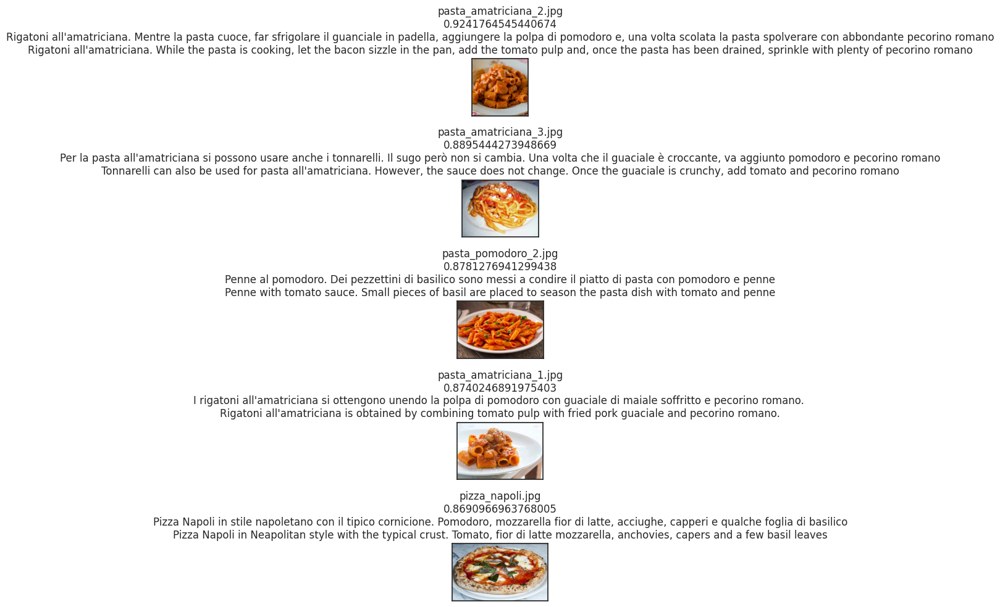

In [52]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()